#1 LOWCOST COMO DIRÍAN MIS AMIKOS

In [ ]:
import numpy as np


J_max = 40.0         # A/cm^2 (Límite del Tungsteno)
lambda_ion = 3.0     # cm 
alpha_loss = 0.01    # Pérdida térmica
r_lim_mag = 5.5      # cm 
limite_esbeltez = 10.0 

I_lab = 222.0        # Amperaje nominal de diseño


rc_vals = np.linspace(0.1, 4.0, 50)
ra_vals = np.linspace(1.0, 10.0, 50)
La_vals = np.linspace(1.0, 20.0, 50) # Ahora iteramos la longitud del ánodo (cámara)

max_eficiencia = -1.0
mejor_rc, mejor_ra, mejor_La, mejor_Lc = 0, 0, 0, 0

for rc in rc_vals:
    for ra in ra_vals:
        if ra <= rc: continue 
            
        for La in La_vals:
            # Definimos que el cátodo sea, por ejemplo, un 70% del largo del ánodo
            Lc = La * 0.70 
            
            # 1. RESTRICCIÓN ESTRUCTURAL (Aplica solo al cátodo)
            if (Lc / rc) > limite_esbeltez: continue 
                
            # 2. EVALUACIÓN TÉRMICA (El área lateral del cátodo emitiendo)
            area_emision = 2 * np.pi * rc * Lc 
            J_actual = I_lab / area_emision
            if J_actual > J_max: continue 
                
            # 3. EVALUACIÓN FÍSICA
            empuje_log = np.log(ra / rc)
            confinamiento = np.exp(-ra / r_lim_mag)
            ionizacion = (1 - np.exp(-La / lambda_ion)) # La cámara permite ionizar
            friccion = (1 - alpha_loss * La)            # El plasma roza todo el ánodo
            
            eficiencia_total = empuje_log * confinamiento * ionizacion * friccion
            
            if eficiencia_total > max_eficiencia:
                max_eficiencia = eficiencia_total
                mejor_rc, mejor_ra, mejor_La, mejor_Lc = rc, ra, La, Lc

# Cálculo de flujo másico crítico (Onset)
flujo_masico_mgs = (I_lab / 1000.0)**2 / 20.0 * 1000.0 

print("==================================================")
print("   DISEÑO ÓPTIMO CORREGIDO (222 Amperios)")
print("==================================================")
print(f"-> Radio del Cátodo (rc) : {mejor_rc:.3f} cm")
print(f"-> Radio del Ánodo  (ra) : {mejor_ra:.3f} cm")
print(f"-> Longitud Ánodo   (La) : {mejor_La:.3f} cm")
print(f"-> Longitud Cátodo  (Lc) : {mejor_Lc:.3f} cm")
print("--------------------------------------------------")
print(f"-> Flujo Másico (Argón)  : {flujo_masico_mgs:.2f} mg/s")
print("==================================================")

   DISEÑO ÓPTIMO CORREGIDO (222 Amperios)
-> Radio del Cátodo (rc) : 0.339 cm
-> Radio del Ánodo  (ra) : 2.653 cm
-> Longitud Ánodo   (La) : 4.490 cm
-> Longitud Cátodo  (Lc) : 3.143 cm
--------------------------------------------------
-> Flujo Másico (Argón)  : 2.46 mg/s


PARA EL SOLVER

Gráficas exportadas con éxito.


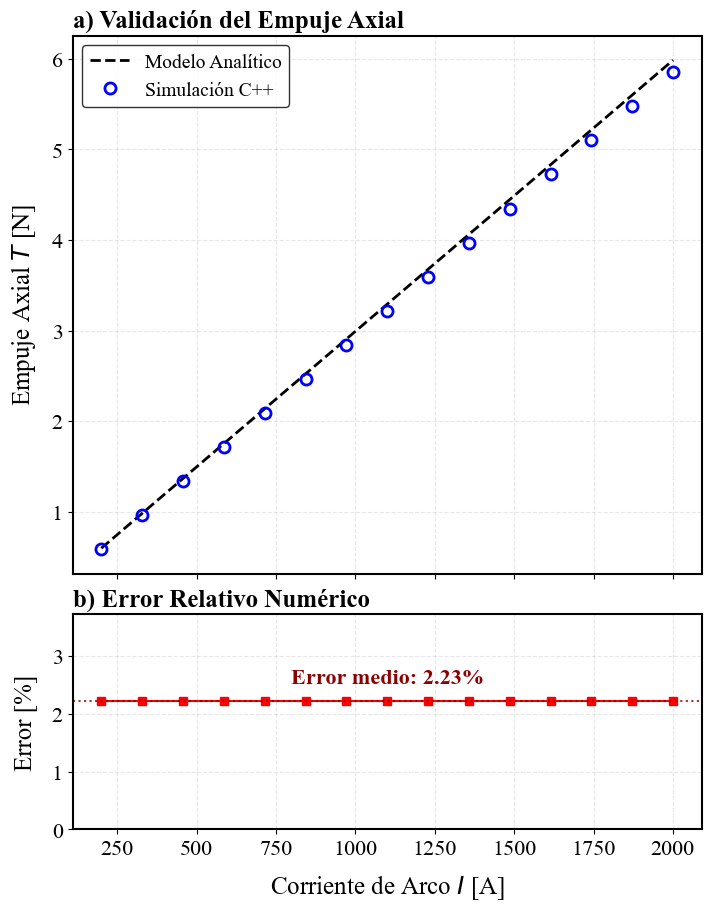

In [ ]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import quad


plt.rcParams.update({
    "text.usetex": False, 
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "font.size": 16,
    "axes.titlesize": 18,
    "axes.labelsize": 18,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16,
    "legend.fontsize": 14,
    "axes.linewidth": 1.5,
    "grid.alpha": 0.3
})


ruta_release = os.path.abspath("../build/Release")
if ruta_release not in sys.path:
    sys.path.append(ruta_release)
import motor_mpd_cpp

Nr, Nz = 30, 80      


r_c, r_a = 0.339, 2.653
L_c, L_a = 3.143, 4.490 

B0_tesla, Parametro_Hall = 0.5, 1.5 


malla = motor_mpd_cpp.Malla2D(Nr, Nz, r_c, r_a, L_c, L_a, True)
R = malla.obtener_R()
Z = malla.obtener_Z() 

campo = motor_mpd_cpp.CampoMagnetico(Nr, Nz)

campo.calcular_campo_aplicado(B0_tesla, L_c, L_a, r_c, r_a, True) 

lorentz = motor_mpd_cpp.FuerzaLorentz(Nr, Nz)

# El cálculo del volumen de los anillos usa el largo total L_a
dz_m = (L_a / 100.0) / (Nz - 1)
r_m = R[:, :-1] / 100.0  
dr_m = np.diff(R, axis=0)[:, :-1] / 100.0 
volumen_anillos = 2.0 * np.pi * r_m[:-1, :] * dr_m * dz_m

corrientes = np.linspace(200, 2000, 15) 
empujes_simulados = []

for I in corrientes:

    lorentz.calcular_tensores(I, Parametro_Hall, L_c, R, Z, campo.Br, campo.Bz)
    
    Fz_SI = np.nan_to_num(lorentz.Fz) * 10000.0  
    T = np.sum(Fz_SI[:-1, :-1] * volumen_anillos)
    empujes_simulados.append(T)
    
empujes_simulados = np.array(empujes_simulados)


L_c_m, a_m = L_c / 100.0, 4.0 / 100.0
rc_m, ra_m = r_c / 100.0, r_a / 100.0

def integrando_Fz(z):
    dBz_dz = -3.0 * B0_tesla * z / (a_m**2 * (1.0 + (z / a_m)**2)**2.5)
    rout = ra_m * (1.0 + (z / a_m)**2)**0.75
    # Usamos L_c_m en el denominador de la densidad de corriente
    return -(Parametro_Hall * 1000.0 / (4.0 * L_c_m)) * dBz_dz * (rout**2 - rc_m**2)

# La integral analítica ahora se evalúa de 0 a L_c_m
empuje_analitico_1000A, _ = quad(integrando_Fz, 0, L_c_m)
m_analitica = empuje_analitico_1000A / 1000.0
empujes_analiticos = m_analitica * corrientes
error_porcentual = np.abs(empujes_simulados - empujes_analiticos) / empujes_analiticos * 100


fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7, 9), 
                               gridspec_kw={'height_ratios': [2.5, 1]}, 
                               sharex=True, constrained_layout=True)

# Panel Superior: Empuje
ax1.plot(corrientes, empujes_analiticos, color='black', linestyle='--', linewidth=2, label='Modelo Analítico')
ax1.plot(corrientes, empujes_simulados, color='blue', marker='o', markersize=8, 
         linestyle='none', fillstyle='none', markeredgewidth=2, label='Simulación C++')

ax1.set_ylabel(r"Empuje Axial $T$ [N]", labelpad=10)
ax1.legend(loc='upper left', frameon=True, edgecolor='black')
ax1.grid(True, linestyle='--')
ax1.set_title("a) Validación del Empuje Axial", fontweight='bold', loc='left')

# Panel Inferior: Error
ax2.plot(corrientes, error_porcentual, color='red', marker='s', markersize=6, linewidth=1.5)
mean_err = np.mean(error_porcentual)
ax2.axhline(mean_err, color='darkred', linestyle=':', alpha=0.8)


ax2.text(corrientes[len(corrientes)//2], mean_err + 0.3, f'Error medio: {mean_err:.2f}%', 
         color='darkred', fontweight='bold', ha='center')

ax2.set_xlabel(r"Corriente de Arco $I$ [A]", labelpad=10)
ax2.set_ylabel(r"Error [%]", labelpad=10) # Corregido para evitar warnings
ax2.set_ylim(0, max(error_porcentual) + 1.5)
ax2.grid(True, linestyle='--')
ax2.set_title("b) Error Relativo Numérico", fontweight='bold', loc='left')


plt.savefig("validacion_empuje_paper.pdf", bbox_inches='tight')

plt.savefig("validacion_empuje_paper.png", dpi=600, bbox_inches='tight')

print("Gráficas exportadas con éxito.")
plt.show()

JUSTIFICACIÓN DE LA GEOMETRÍA

Imagen guardada con éxito.


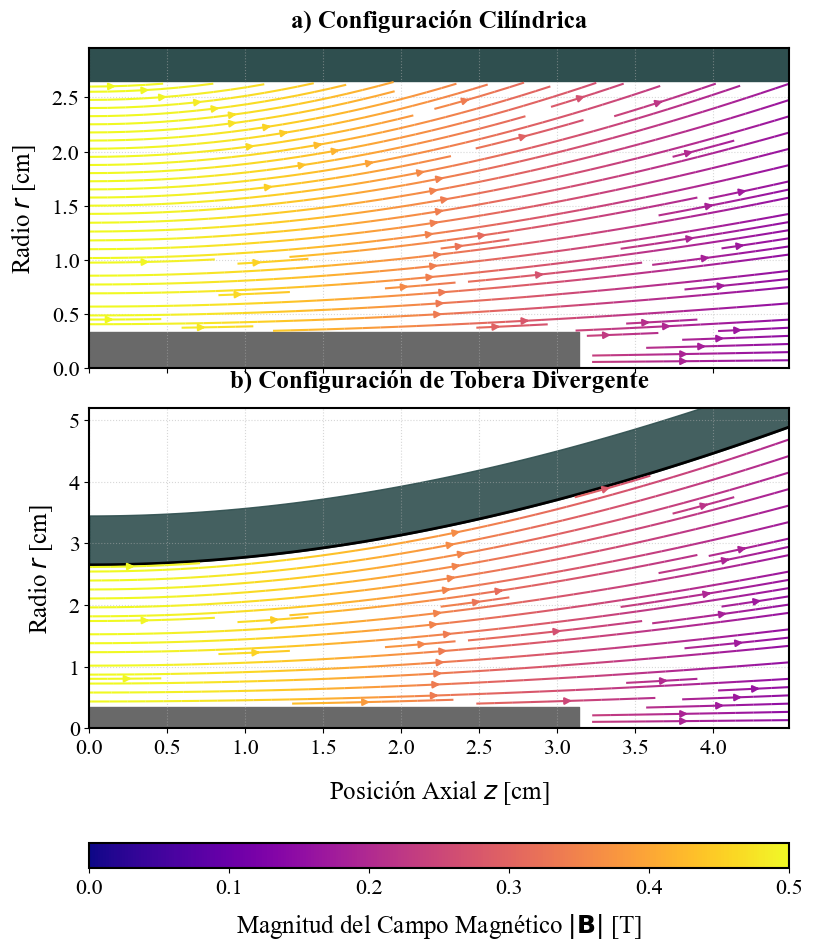

In [ ]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata


FONT_SIZE_BASE = 16 

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "font.size": FONT_SIZE_BASE,           
    "axes.titlesize": FONT_SIZE_BASE + 2,
    "axes.labelsize": FONT_SIZE_BASE + 2,
    "xtick.labelsize": FONT_SIZE_BASE,
    "ytick.labelsize": FONT_SIZE_BASE,
})


r_c, r_a = 0.339, 2.653
L_c, L_a = 3.143, 4.490 
Nr, Nz = 30, 60 
B0_tesla = 0.5 

ruta_release = os.path.abspath("../build/Release")
if ruta_release not in sys.path:
    sys.path.append(ruta_release)
import motor_mpd_cpp

# Cálculos (Pasamos L_c y L_a a la malla)
malla_cil = motor_mpd_cpp.Malla2D(Nr, Nz, r_c, r_a, L_c, L_a, False)
B_cil = motor_mpd_cpp.CampoMagnetico(Nr, Nz)
B_cil.calcular_campo_aplicado(B0_tesla, L_c, L_a, r_c, r_a, False)

malla_cam = motor_mpd_cpp.Malla2D(Nr, Nz, r_c, r_a, L_c, L_a, True)
B_cam = motor_mpd_cpp.CampoMagnetico(Nr, Nz)
B_cam.calcular_campo_aplicado(B0_tesla, L_c, L_a, r_c, r_a, True)


fig = plt.figure(figsize=(10, 10), facecolor='white')

ax1 = fig.add_axes([0.15, 0.58, 0.7, 0.32]) 
ax2 = fig.add_axes([0.15, 0.22, 0.7, 0.32]) 
cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.025]) 

def dibujar_en_eje(ax, malla, B_field, titulo, es_campana):
    Z, R = malla.obtener_Z(), malla.obtener_R()
    

    ax.fill_between([0, L_c], [0, 0], [r_c, r_c], color='dimgray')
    
    if es_campana:
        z_w = np.linspace(0, L_a, 100)

        r_w = r_a * (1.0 + (z_w / 4.0)**2)**0.75 
        ax.plot(z_w, r_w, color='black', linewidth=2)
        ax.fill_between(z_w, r_w, r_w + 0.8, color='darkslategray', alpha=0.9)
        r_max = np.max(r_w)
    else:
        ax.fill_between([0, L_a], [r_a, r_a], [r_a + 0.8, r_a + 0.8], color='darkslategray')
        r_max = r_a

    # Interpolación usando L_a como largo total
    z_c, r_c_grid = np.linspace(0, L_a, 150), np.linspace(0, r_max + 0.2, 150)
    Z_g, R_g = np.meshgrid(z_c, r_c_grid)
    Bz_i = griddata(np.column_stack((Z.flatten(), R.flatten())), B_field.Bz.flatten(), (Z_g, R_g), method='linear')
    Br_i = griddata(np.column_stack((Z.flatten(), R.flatten())), B_field.Br.flatten(), (Z_g, R_g), method='linear')

    # Máscaras
    lim = r_a * (1.0 + (Z_g / 4.0)**2)**0.75 if es_campana else r_a
    
    # 1. Ocultar campo fuera del ánodo
    Bz_i[R_g > lim] = np.nan
    Br_i[R_g > lim] = np.nan
    

    mascara_catodo = (R_g < r_c) & (Z_g <= L_c)
    Bz_i[mascara_catodo] = np.nan
    Br_i[mascara_catodo] = np.nan

    strm = ax.streamplot(z_c, r_c_grid, Bz_i, Br_i, color=np.sqrt(Bz_i**2 + Br_i**2), 
                         cmap='plasma', linewidth=1.5, density=1.3, norm=plt.Normalize(0, 0.5))
    
    ax.set_title(titulo, fontweight='bold', pad=15)
    ax.set_ylabel(r"Radio $r$ [cm]", labelpad=10)
    ax.set_ylim(0, r_max + 0.3)
    # Ajustamos el límite X para que termine en L_a
    ax.set_xlim(0, L_a) 
    ax.grid(True, linestyle=':', alpha=0.5)
    return strm

# Ejecutar dibujo
strm1 = dibujar_en_eje(ax1, malla_cil, B_cil, "a) Configuración Cilíndrica", False)
strm2 = dibujar_en_eje(ax2, malla_cam, B_cam, "b) Configuración de Tobera Divergente", True)

ax2.set_xlabel(r"Posición Axial $z$ [cm]", labelpad=15)
ax1.set_xticklabels([]) 

cbar = fig.colorbar(strm2.lines, cax=cbar_ax, orientation='horizontal')
cbar.set_label(r"Magnitud del Campo Magnético $|\mathbf{B}|$ [T]", labelpad=10)

plt.savefig("campos_simetricos.png", dpi=300, bbox_inches=None)
print("Imagen guardada con éxito.")
plt.show()

In [ ]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 100.0


ruta_modulo = os.path.abspath("../build/Release") 
if ruta_modulo not in sys.path: 
    sys.path.append(ruta_modulo)

import motor_mpd_cpp


Nr, Nz = 30, 80      
r_c, L_c = 0.339, 3.143 
r_a_base, L_a = 2.653, 4.490 
r_a_max = 5.0
L_sim = 6.5
dt = 5e-10
N_iones = 1000

R_1D = np.linspace(0, r_a_max, Nr)
Z_1D = np.linspace(0, L_sim, Nz)


R, Z = np.meshgrid(R_1D, Z_1D, indexing='ij')


# Inicialmente, APAGAMOS TODAS LAS FUERZAS como en la prueba balística
Bz = np.zeros_like(R) 
Br = np.zeros_like(R)
Er = np.zeros_like(R)
Ez = np.zeros_like(R)



# 1. Definimos la magnitud máxima de la fuerza inventada
# 5000 V/m es un buen punto de partida para aplastar los iones visiblemente
E_max = 0.5 

# 2. Creamos la máscara booleana (El delimitador de la región)
# Python buscará simultáneamente en toda la matriz dónde se cumplen estas 4 condiciones:
# Z entre 0 y L_c Y R entre r_c y 0.8
mascara_region = (Z >= 0.1) & (Z <= L_c) & (R >= r_c) & (R <= 0.8)

# 3. Aplicamos la fuerza y el gradiente SOLO donde la máscara sea Verdadera (True)
# - Signo negativo: Empuja radialmente hacia el centro (-R).
# - E_max: La fuerza máxima justo en Z = 0.
# - (1.0 - (Z / L_c)): El factor que hace que decaiga a 0 a medida que se acerca a L_c.
Er[mascara_region] = -E_max * (1.0 - (Z[mascara_region] / L_c))

# --- INYECCIÓN DEL SEGUNDO CAMPO SINTÉTICO (-Z) ---

# 1. Definimos la magnitud de la fuerza de succión hacia atrás
E_max_z = 10.0 # V/m (Un valor brutal para vencer la inercia axial)

# 2. Creamos la máscara para la zona central aguas abajo del cátodo
mascara_punta = (Z >= L_c) & (Z <= L_a) & (R >= 0.0) & (R <= r_c)

# 3. Aplicamos la fuerza SOLO en esa región
# El signo negativo asegura que la fuerza apunte hacia atrás (-Z)
Ez[mascara_punta] = -E_max_z


Parametro_Hall = 1.5
corriente_A = 222.0 


campo = motor_mpd_cpp.CampoMagnetico(Nr, Nz)
campo.calcular_campo_aplicado(0.5, L_c, L_a, r_c, r_a_max, True)

lorentz = motor_mpd_cpp.FuerzaLorentz(Nr, Nz)
lorentz.calcular_tensores(corriente_A, Parametro_Hall, L_c, R, Z, campo.Br, campo.Bz)


Fz_base = np.nan_to_num(lorentz.Fz)
Fr_base = np.nan_to_num(lorentz.Fr)


epsilon = 0.05
mascara_empuje = (Z >= 0.0) & (Z <= L_c) & (R >= (0.8 + epsilon)) & (R <= r_a_base)


factor_escalado = 0.275 #

# 4. Inyectamos la topología de Lorentz en el Campo Eléctrico [cite: 1501]
Ez[mascara_empuje] = Fz_base[mascara_empuje] * factor_escalado
Er[mascara_empuje] = np.abs(Fr_base[mascara_empuje]) * factor_escalado




# Las matrices deben ser contiguas en memoria para que C++ las lea sin colapsar
Ez = np.ascontiguousarray(Ez)
Er = np.ascontiguousarray(Er)
Bz = np.ascontiguousarray(Bz)
Br = np.ascontiguousarray(Br)

# Geometría de la pared del ánodo
limite_pared = r_a_base + 0.15 * np.power(Z_1D, 2.0)
limite_pared = np.clip(limite_pared, 0, r_a_max)
limite_pared_c = np.ascontiguousarray(limite_pared)


Te_eV = 1.5 

# Propiedades termodinámicas del gas de inyección (Argón Neutro)
T_gas_K = 300.0          # Temperatura de inyección en Kelvin
gamma = 5.0 / 3.0        # Índice adiabático para gas monoatómico (Argón)
k_B = 1.38e-23           # Constante de Boltzmann (J/K)
masa_ion_kg = 6.63e-26   # Masa del átomo de Argón (kg)

# Ecuación paramétrica de la velocidad inicial (Velocidad del sonido local)
u_z_inicial = np.sqrt((gamma * k_B * T_gas_K) / masa_ion_kg)




# Inicializamos el simulador
solver = motor_mpd_cpp.SimuladorPIC(N_iones, Te_eV, r_c, r_a_max, L_c, L_a, Nr)

solver.inicializar_particulas(15000.0, r_a_base)

# Leemos posición inicial (solo del primer ion para probar)
pos_ini = solver.obtener_posiciones_rz()
print(f"Posición inicial Ion 0: R={pos_ini[0,0]:.4f}, Z={pos_ini[0,1]:.4f}")

# Damos 10 pasos
for _ in range(10):
    solver.avanzar_paso_temporal_boris(dt, Ez, Er, Bz, Br, limite_pared_c, L_sim, Nz)

# Leemos posición final
pos_fin = solver.obtener_posiciones_rz()
print(f"Posición final Ion 0:   R={pos_fin[0,0]:.4f}, Z={pos_fin[0,1]:.4f}")

# Verificamos si hubo cambio
if abs(pos_fin[0,1] - pos_ini[0,1]) > 0:
    print("¡ÉXITO! Los iones se están moviendo.")
else:
    print("ERROR: Los iones siguen estáticos.")

solver.inicializar_particulas(u_z_inicial, r_a_base)




fig, ax1 = plt.subplots(figsize=(10, 5), facecolor='white')
ax1.set_xlim(0, L_sim)
ax1.set_ylim(0, r_a_max)
ax1.set_xlabel('Posición Axial Z (cm)', fontsize=12)
ax1.set_ylabel('Radio R (cm)', fontsize=12)

ax1.fill_between([0, L_c], [0, 0], [r_c, r_c], color='dimgray', label='Cátodo')
ax1.fill_between(Z_1D, limite_pared, r_a_max, color='darkslategray', alpha=0.8, label='Ánodo')
ax1.axvline(x=L_c, color='red', linestyle='--', alpha=0.5, label='Punta (Z=L_c)')
ax1.fill_between([L_c, L_sim], [0, 0], [1.0, 1.0], color='yellow', alpha=0.15, label='Zona de Retorno')

# Contenedores para la animación
scat_vivos = ax1.scatter([], [], color='cyan', s=10, zorder=5, label='En tránsito')
scat_barril = ax1.scatter([], [], color='red', s=15, zorder=6, label='Colisión Barril')
scat_punta = ax1.scatter([], [], color='purple', s=20, zorder=6, label='Colisión Punta')
scat_escape = ax1.scatter([], [], color='lime', s=10, zorder=5, label='Eyectados')

ax1.legend(loc='upper right', bbox_to_anchor=(1.0, 1.15), ncol=5, fontsize=9)
titulo = ax1.set_title('Iniciando Simulación Híbrida...', fontsize=14, fontweight='bold', pad=25)


def update(frame):
    for _ in range(4000):
        # Alimentamos a Boris con los campos calculados en Python
        solver.avanzar_paso_temporal_boris(dt, Ez, Er, Bz, Br, limite_pared_c, L_sim, Nz)

    pos = solver.obtener_posiciones_rz()
    estados = solver.obtener_estados()
    
    Zp = pos[:, 1] * 100.0
    Rp = pos[:, 0] * 100.0
    
    m_vivos = estados == 0
    m_barril = estados == 1
    m_punta = estados == 2
    m_escape = estados == 3
    
    scat_vivos.set_offsets(np.column_stack((Zp[m_vivos], Rp[m_vivos])))
    scat_barril.set_offsets(np.column_stack((Zp[m_barril], Rp[m_barril])))
    scat_punta.set_offsets(np.column_stack((Zp[m_punta], Rp[m_punta])))
    scat_escape.set_offsets(np.column_stack((Zp[m_escape], Rp[m_escape])))

    tiempo_us = (frame * 500 * dt) * 1e6
    titulo.set_text(f"t = {tiempo_us:.2f} μs | Vivos: {np.sum(m_vivos)} | Escape (Verde): {np.sum(m_escape)} | "
                    f"Punta (Morado): {np.sum(m_punta)} | Barril (Rojo): {np.sum(m_barril)}")
    return scat_vivos, scat_barril, scat_punta, scat_escape, titulo

print("Generando animación interactiva... ¡paciencia!")
anim = FuncAnimation(fig, update, frames=300, interval=40, blit=True)


plt.close(fig)


display(HTML(anim.to_jshtml()))

Posición inicial Ion 0: R=0.0198, Z=-0.0130
Posición final Ion 0:   R=0.0198, Z=-0.0129
¡ÉXITO! Los iones se están moviendo.
Generando animación interactiva... ¡paciencia!
